# Integration of simulated and experimentally determined thermophysical properties of aqueous mixtures by ThermoML 

# 1. Data generation
## Read in simulated data

The workflow MixtureMM of Benjamin Schmitz returned .json files for density and self-diffusion coefficient.

Note: To run this code, make sure that you have installed pyThermoML as described in the corresponding README.md file.

The modules are available on GitHub, accesible with the following links:
* pyThermoML: https://github.com/FAIRChemistry/pyThermoML

In [4]:
from pythermo_workflow.mixturemm_thermoml import MixtureMMThermoML

converter_sim = MixtureMMThermoML(folder_mixtureMM_files="mixturemm_files/", folder_thermoML_files="thermoml_files/")

The density .json files can directly be converted into objects of pyThermoML's DataReport class and don't have to be modified.

In [6]:
dataset_sim_dens_meth = converter_sim.read_density(json_file="dens_meth.json")
dataset_sim_dens_glyc = converter_sim.read_density(json_file="dens_glyc.json")

Concerning the self-diffusion coefficient we have to perform the optimized linear regression as described in the main part of this paper, by minimizing the following equation:

$G(D_1^{\infty}, D_2^{\infty}, a) = \sum_{i=1}^{n}(D_1^{i}-(D_1^{\infty}+a*x^{i}))^2 + \sum_{i=1}^{n}(D_2^{i}-(D_2^{\infty}+a*x^{i}))^2$

$D_1^{\infty}$ and $D_2^{\infty}$ are the extrapolated self-diffusion coefficients of two components. ($D_1^{i},x^{i}$) and ($D_2^{i},x^{i}$) are pairs of values of self-diffusion coefficient and inverse box sizes that have been simulated. n is the number of data points, a is the common slope. 

First we have to load our .json files, transform them into a pandas dataframe and perform the optimized linear regression.

In [7]:
import json

json_sim_transp_meth = json.load(open(f"{converter_sim.folder_mixtureMM_files}transport_meth.json"))
json_sim_transp_glyc = json.load(open(f"{converter_sim.folder_mixtureMM_files}transport_glyc.json"))

df_sim_transp_meth = converter_sim.extract_sdiff_to_dataframe(json_data=json_sim_transp_meth)
df_sim_transp_glyc = converter_sim.extract_sdiff_to_dataframe(json_data=json_sim_transp_glyc)

df_sim_transp_meth_r = converter_sim.regression(df=df_sim_transp_meth)
df_sim_transp_glyc_r = converter_sim.regression(df=df_sim_transp_glyc)

If we want to visualize our regression we can create the regression plot for specific temperature and $\chi_w$. In this case for the aqueous methanol mixture at $T = 318.15K$ and $\chi_w = 0.5$.

     xw    temp      sdiffWat  err_sdiffWat     sdiffComp  err_sdiffComp  \
0   0.0  288.15           NaN           NaN  1.315374e-12   4.409299e-14   
1   0.1  288.15  9.238051e-12  3.620417e-13  1.367208e-12   6.510717e-14   
2   0.2  288.15  1.304983e-11  4.965078e-13  3.475043e-12   1.651475e-13   
3   0.3  288.15  1.704215e-11  5.699498e-13  3.591020e-12   1.053247e-13   
4   0.4  288.15  2.568719e-11  9.870936e-13  6.220844e-12   2.562637e-13   
5   0.5  288.15  3.870693e-11  1.982517e-12  7.776784e-12   4.168775e-13   
6   0.6  288.15  7.244807e-11  2.711844e-12  1.894130e-11   6.789240e-13   
7   0.7  288.15  1.410473e-10  4.229958e-12  3.647135e-11   1.171745e-12   
8   0.8  288.15  3.054329e-10  9.931551e-12  9.056986e-11   4.005299e-12   
9   0.9  288.15  6.980476e-10  1.523585e-11  2.366716e-10   9.615251e-12   
10  1.0  288.15  1.640449e-09  5.156851e-11           NaN            NaN   
11  0.0  293.15           NaN           NaN  2.152985e-12   5.720896e-14   
12  0.1  293

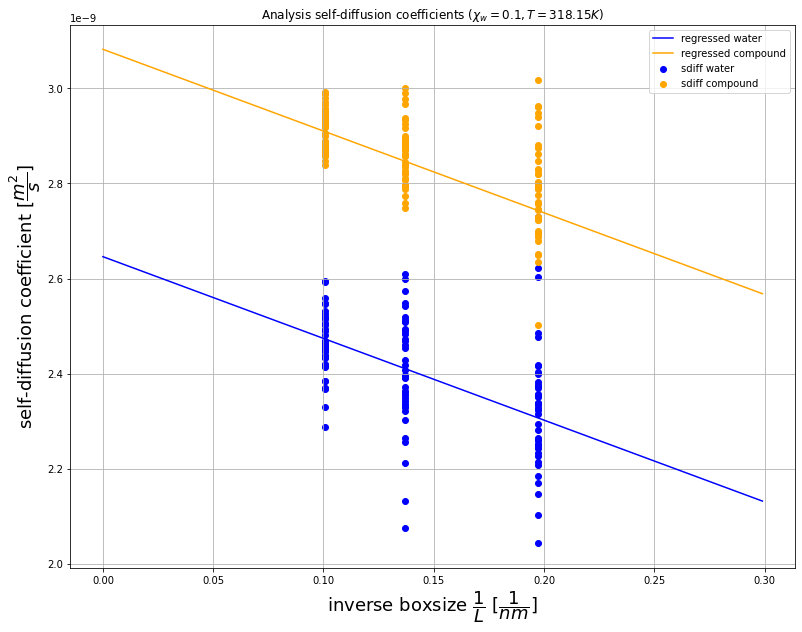

In [8]:
converter_sim.vis_regression(df=df_sim_transp_meth, df_result=df_sim_transp_meth_r, temp=318.15, xw=0.1)
print(df_sim_transp_glyc_r)

Finally we transform the new generated self-diffusion coefficient data into a DataReport object.

In [10]:
dataset_sim_transp_meth = converter_sim.create_data_report(result_df=df_sim_transp_meth_r)
dataset_sim_transp_glyc = converter_sim.create_data_report(result_df=df_sim_transp_glyc_r)

## Read in experimental data

To integrate already published experimental data we  manually transform published tables into .txt files. Aqueous methanol density data was extracted from Mikhail et al., self-diffusion coefficient data from Derlacki et al. and viscosity data from Gonzalez et al. Aqueous glycerol density data from Cristancho et al.. Self-diffusion coefficient data from D’Errico et al.[17] and viscosity data from Segur et al.


In [11]:
from pythermo_workflow.experimental_thermoml import ExperimentThermoML

converter_exp = ExperimentThermoML(folder_txt_files="txt_files/", folder_thermoML_files="thermoML_files/")

Meta data and compound information are added manually in the described reader functions. Density and self-diffusion coefficient .txt files can be readed with read_csv() of the pandas dataframe library and then converted into objects of pyThermoML's DataReport class.

In [12]:
dataset_exp_dens_meth = converter_exp.readDensMeth(txt_file="dens_meth.txt")
dataset_exp_dens_glyc = converter_exp.readDensGlyc(txt_file="dens_glyc.txt")
dataset_exp_sdiff_meth = converter_exp.readSDiffMeth(txt_file1="sdiff_meth_278.txt", txt_file2="sdiff_meth_298.txt")
dataset_exp_sdiff_glyc = converter_exp.readSDiffGlyc(txt_file="sdiff_glyc_298.txt")

## Upload to data repository of the university of Stuttgart

To make our datasets available, we can create ThermoML files

In [13]:
from pythermo.thermoml.tools.writeTools import ThermoMLWriter

writer = ThermoMLWriter(folder_thermoML_files="thermoml_files/")

writer.writeThermo(dataReport=dataset_sim_dens_meth, filename="sim_dens_meth.xml")
writer.writeThermo(dataReport=dataset_sim_dens_glyc, filename="sim_dens_glyc.xml")
writer.writeThermo(dataReport=dataset_sim_transp_meth, filename="sim_transp_meth.xml")
writer.writeThermo(dataReport=dataset_sim_transp_glyc, filename="sim_transp_glyc.xml")
writer.writeThermo(dataReport=dataset_exp_dens_meth, filename="exp_dens_meth.xml")
writer.writeThermo(dataReport=dataset_exp_dens_glyc, filename="exp_dens_glyc.xml")
writer.writeThermo(dataReport=dataset_exp_sdiff_meth, filename="exp_sdiff_meth.xml")
writer.writeThermo(dataReport=dataset_exp_sdiff_glyc, filename="exp_sdiff_glyc.xml")


And upload them to DaRUS with functionalities of pyThermoML:

In [14]:
from pythermo.thermoml.tools.readTools import ThermoMLReader
from pythermo.thermoml.tools.uploadTools import ThermoMLDaRUSHandler
from pyDaRUS.metadatablocks.citation import SubjectEnum
import os

handler = ThermoMLDaRUSHandler(folder_thermoML_files="thermoml_files/")
reader = ThermoMLReader(folder_thermoML_files="thermoml_files/")

authors = ["Matthias Gueltig, Jan Range, Benjamin Schmitz, Juergen Pleiss"]
contact_name = "Matthias Gueltig"
contact_mail = "matthias.gueltig@ibtb.uni-stuttgart.de"
subject = [SubjectEnum.chemistry, SubjectEnum.mathematical__sciences, SubjectEnum.physics, SubjectEnum.engineering]
dv_name = "ibtb_thermoml"

file_dict = {
    "sim_dens_meth.xml": {
        "title": "Densities of simulated aqueous methanol mixtures",
        "descr": "Densities of simulated aqueous methanol mixtures integrated into ThermoML."
    },
    "sim_dens_glyc.xml": {
        "title": "Densities of simulated aqueous glycerol mixtures",
        "descr": "Densities of simulated aqueous glycerol mixtures integrated into ThermoML."
    },
    "sim_transp_meth.xml": {
        "title": "Self-diffusion coefficients of simulated aqueous methanol mixtures",
        "descr": "Self-diffusion coefficients of simulated aqueous methanol mixtures integrated into ThermoML."
    },
    "sim_transp_glyc.xml": {
        "title": "Self-diffusion coefficients of simulated aqueous glycerol mixtures",
        "descr": "Self-diffusion coefficients of simulated aqueous glycerol mixtures integrated into ThermoML."
    },
    "exp_dens_meth.xml": {
        "title": "Densities of experimental aqueous methanol mixtures",
        "descr": "Densities of experimental aqueous methanol mixtures extracted from the related publication and integrated into ThermoML."
    },
    "exp_dens_glyc.xml": {
        "title": "Densities of experimental aqueous glycerol mixtures",
        "descr": "Densities of experimental aqueous glycerol mixtures extracted from the related publication and integrated into ThermoML."
    },
    "exp_sdiff_meth.xml": {
        "title": "Tracer-diffusion coefficients of experimental aqueous methanol mixtures",
        "descr": "Tracer-diffusion coefficients of experimental aqueous methanol mixtures extracted from the related publication and integrated into ThermoML."
    },
    "exp_sdiff_glyc.xml": {
        "title": "Self-diffusion coefficients of experimental aqueous glycerol mixtures",
        "descr": "Self-diffusion coefficients of experimental aqueous glcerol mixtures extracted from the related publication and integrated into ThermoML."
    }
}

p_ids = list()

for filename, value in file_dict.items():
    p_ids.append(handler.uploadToDaRUS(thermoML_filename=filename, dv_path=filename, dv_name=dv_name, title = value["title"], subject = subject, description = value["descr"], authors=authors, contact_name=contact_name, contact_mail = contact_mail))

Dataset with pid 'doi:10.18419/darus-3112' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3112
Dataset with pid 'doi:10.18419/darus-3113' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3113
Dataset with pid 'doi:10.18419/darus-3114' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3114
Dataset with pid 'doi:10.18419/darus-3115' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3115
Dataset with pid 'doi:10.18419/darus-3116' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3116
Dataset with pid 'doi:10.18419/darus-3117' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3117
Dataset with pid 'doi:10.18419/darus-3118' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3118
Dataset with pid 'doi:10.18419/darus-3119' created.
htt

# 2. Data analysis and visualization
## 2.1 Analysis of density derived properties
Based on integrated density data, the molar volume, the molar excess volume, thermal expansion coefficient and excess thermal expansion coefficient can calculated for each mole fraction and temperature, with the methods proposed in methods section of this paper.

### 2.1.1 Analysis of experimental and simulated methanol density data
First we have to load our data from DaRUS or local disk.

In [2]:
from pythermo.thermoml.tools import ThermoMLReader

reader = ThermoMLReader(folder_thermoML_files="thermoml_files/")
dataset_sim_dens_meth = reader.readFromThermoMLFile(filename="sim_dens_meth.xml")
dataset_exp_dens_meth = reader.readFromThermoMLFile(filename="exp_dens_meth.xml")

dataset_sim_dens_glyc = reader.readFromThermoMLFile(filename="sim_dens_glyc.xml")
dataset_exp_dens_glyc = reader.readFromThermoMLFile(filename="exp_dens_glyc.xml")

In order to analyze the large datasets, we convert our DataReport objects into a pandas dataframe. The parameter "compound" is needed to acces a dictionary of the molar masses of the respective compounds to calculate the molar Volume.

In [3]:
from pythermo_workflow.analysis import Analysis

analysis = Analysis()

# Density derived properties
dataframe_sim_dens_meth_molVol = analysis.calcMolarVolumeCompWat(dataReport = dataset_sim_dens_meth, pomID="pom1", compound="methanol")
dataframe_exp_dens_meth_molVol = analysis.calcMolarVolumeCompWat(dataReport = dataset_exp_dens_meth, pomID="pom1", compound="methanol")

dataframe_sim_dens_glyc_molVol = analysis.calcMolarVolumeCompWat(dataReport = dataset_sim_dens_glyc, pomID="pom1", compound="glycerol")
dataframe_exp_dens_glyc_molVol = analysis.calcMolarVolumeCompWat(dataReport = dataset_exp_dens_glyc, pomID="pom1", compound="glycerol")

The units are derived from integrated density data:

Mass density $[\frac{kg}{m^3}]$, Temperature $[K]$, Mole fraction of each compound $[\frac{mole}{mole}]$ and the molar Volume quantities in $[\frac{m^3}{mole}]$

The logarithm of the molar volume is needed in the next section.

### 2.1.2 Visualization of density derived properties
To visualize our results we can import the Visualize class from the visualize package. By adding the dataframes that we want to visualize, defining x- and y-Axis with the respective dataframe syllabus and declaring which compound we have used, the visualization of our dataset wil be saved.

In [4]:
from pythermo_workflow.visualize import Visualize

vis = Visualize(folder_images="plots/")

dfs_meth = [dataframe_sim_dens_meth_molVol, dataframe_exp_dens_meth_molVol]
dfs_glyc = [dataframe_sim_dens_glyc_molVol, dataframe_exp_dens_glyc_molVol]

print(dfs_glyc)

[    Mass density  p1_uncert  Temperature  Mfcw  Mfcc      method     Vreal  \
0    1230.738025   1.937330       288.15   0.0   1.0  simulation  0.000075   
1    1226.867969   2.256269       288.15   0.1   0.9  simulation  0.000069   
2    1223.103032   2.396459       288.15   0.2   0.8  simulation  0.000063   
3    1216.631725   2.758918       288.15   0.3   0.7  simulation  0.000057   
4    1209.706342   2.678523       288.15   0.4   0.6  simulation  0.000052   
5    1199.791535   3.050486       288.15   0.5   0.5  simulation  0.000046   
6    1186.947087   3.160012       288.15   0.6   0.4  simulation  0.000040   
7    1167.298483   3.311028       288.15   0.7   0.3  simulation  0.000034   
8    1137.010679   3.895148       288.15   0.8   0.2  simulation  0.000029   
9    1088.040027   4.523446       288.15   0.9   0.1  simulation  0.000023   
10    998.194791   5.724816       288.15   1.0   0.0  simulation  0.000018   
11   1228.416182   2.260370       293.15   0.0   1.0  simulatio

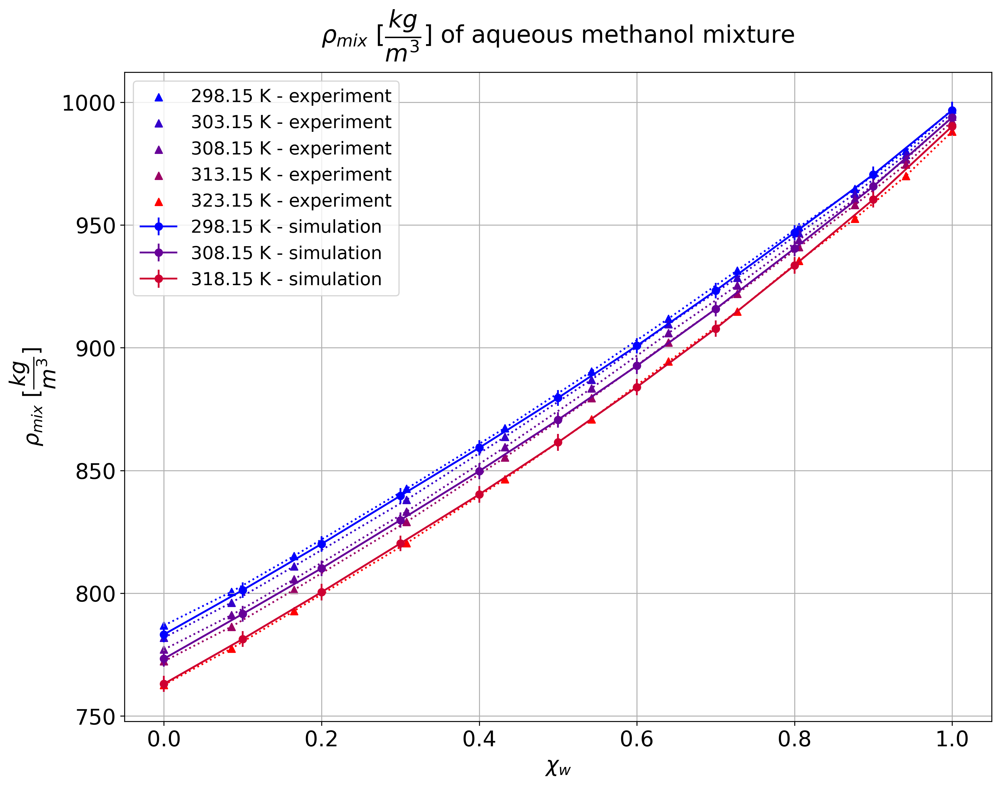

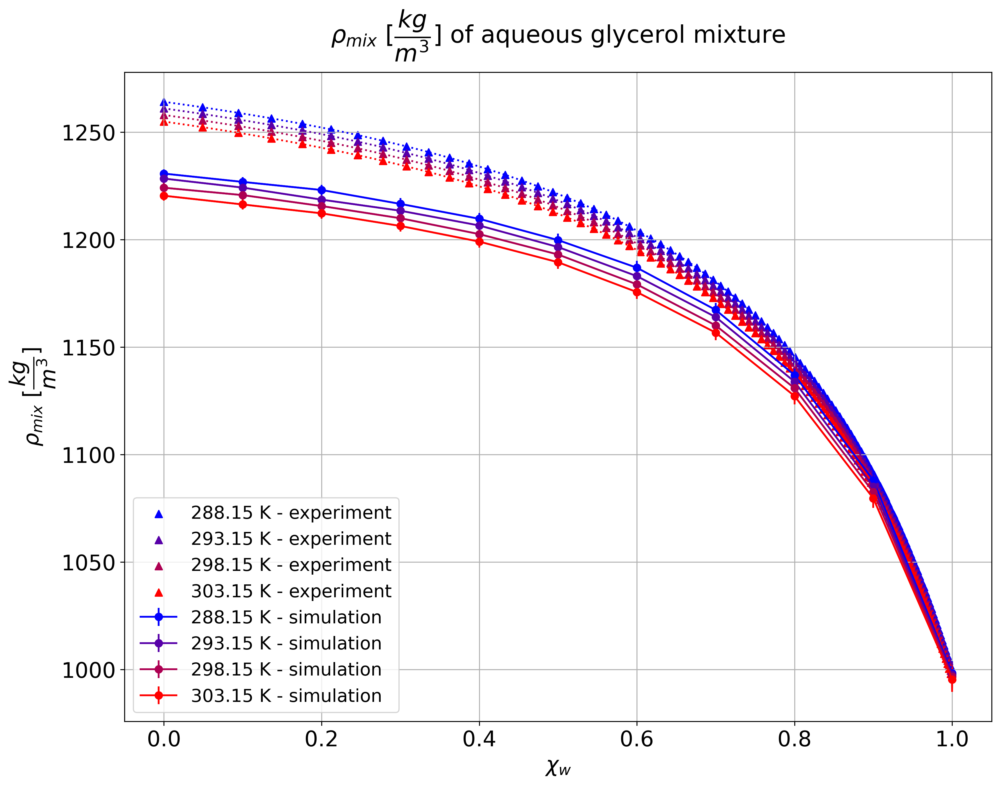

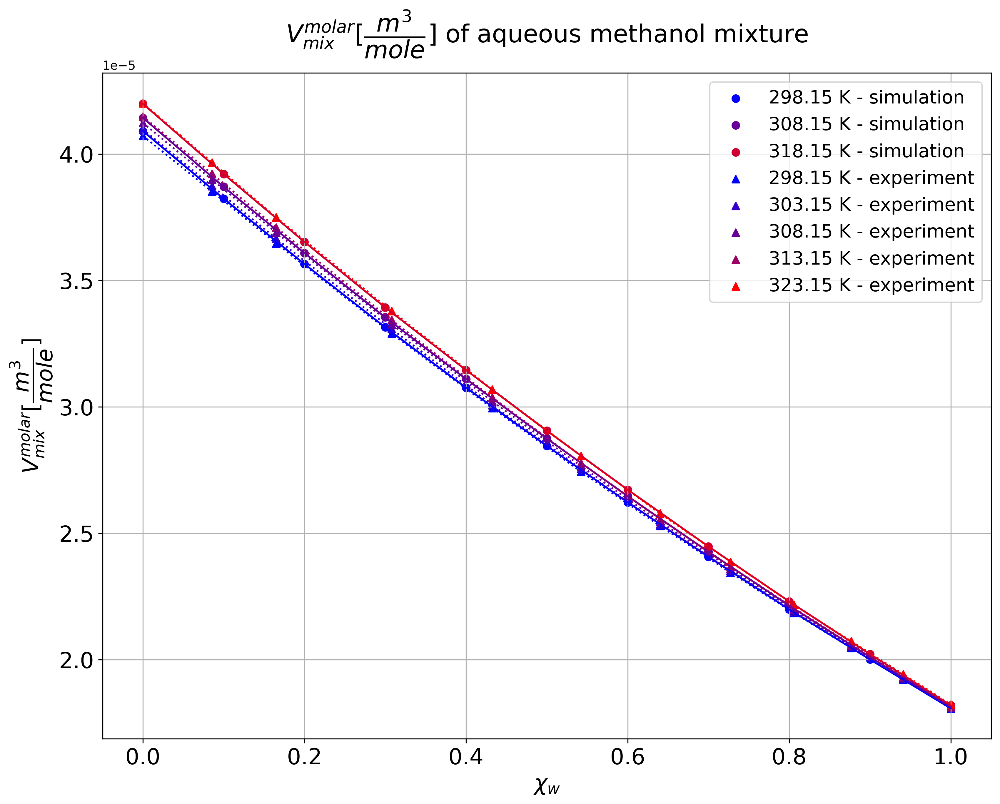

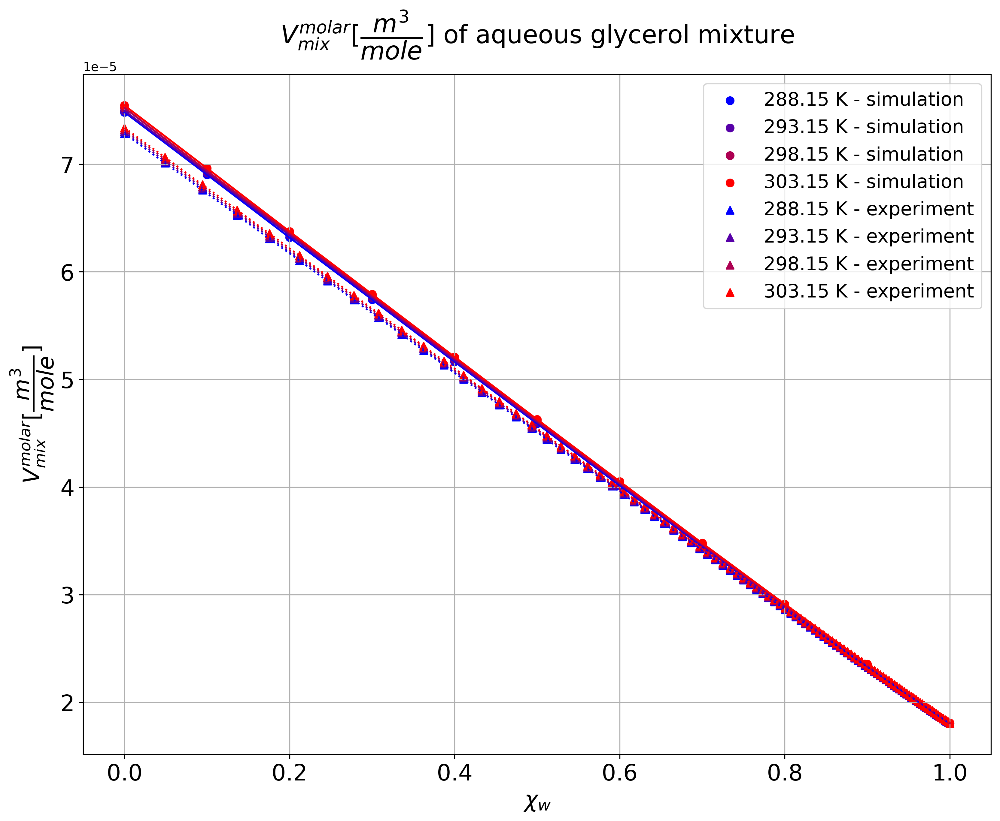

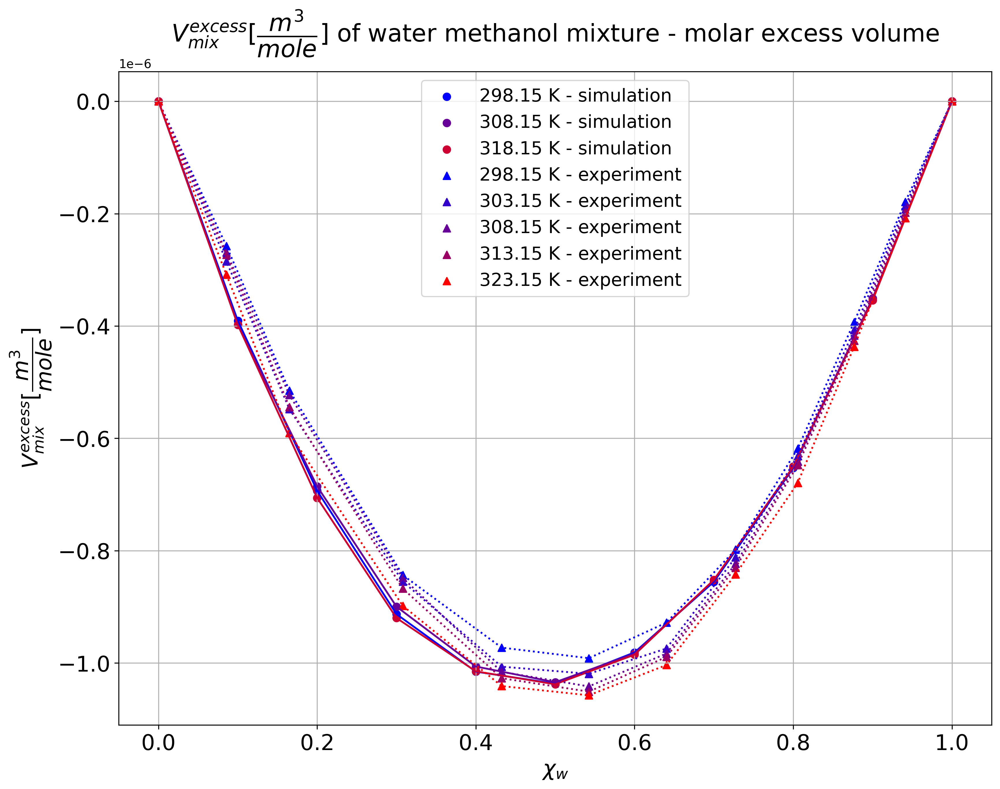

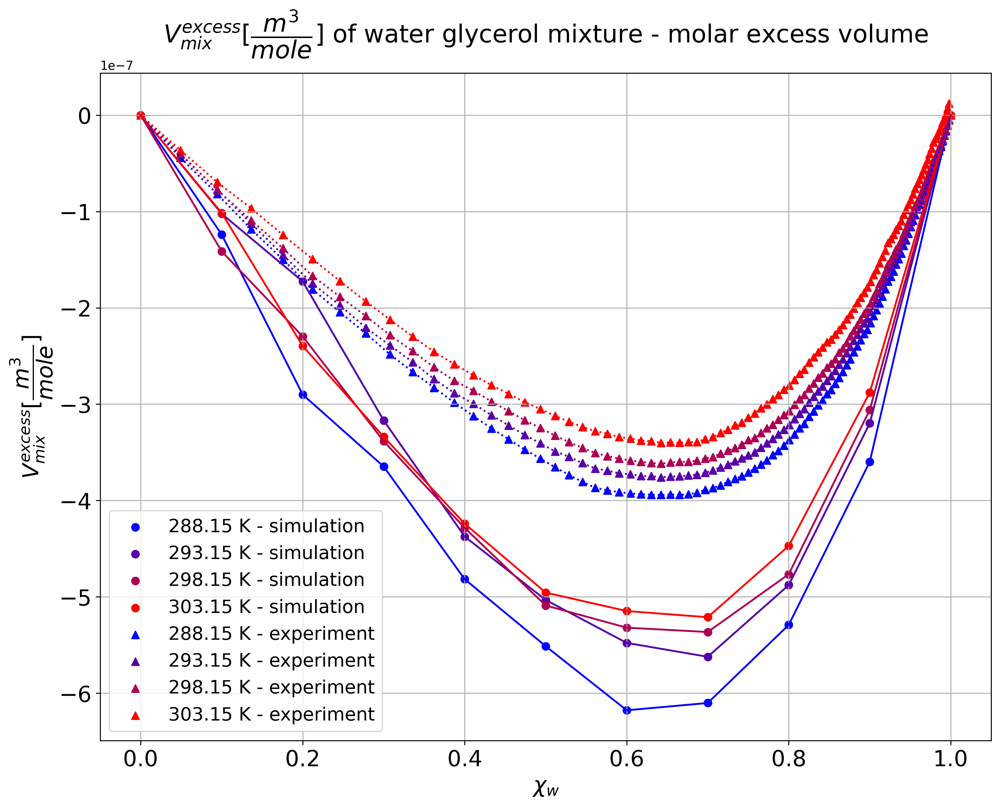

In [5]:
from pythermo_workflow.visualize import Visualize

vis = Visualize(folder_images="plots/")

dfs_meth = [dataframe_sim_dens_meth_molVol, dataframe_exp_dens_meth_molVol]
dfs_glyc = [dataframe_sim_dens_glyc_molVol, dataframe_exp_dens_glyc_molVol]

# Mass density
vis.plotDataFrame(dfs=dfs_meth, xAx = "Mfcw", yAx = "Mass density", compound="methanol", errorbar="p1_uncert")
vis.plotDataFrame(dfs=dfs_glyc, xAx = "Mfcw", yAx = "Mass density", compound="glycerol", errorbar="p1_uncert")

# Molar volume
vis.plotDataFrame(dfs=dfs_meth, xAx = "Mfcw", yAx = "Vreal", compound="methanol")
vis.plotDataFrame(dfs=dfs_glyc, xAx = "Mfcw", yAx = "Vreal", compound="glycerol")

# Molar excess volume
vis.plotDataFrame(dfs=dfs_meth, xAx = "Mfcw", yAx = "Vexcess", compound="methanol")
vis.plotDataFrame(dfs=dfs_glyc, xAx = "Mfcw", yAx = "Vexcess", compound="glycerol")

### 2.2.3 Arrhenius analysis of density derived properties

As described in our paper we analyzed the molar volume of the mixtures with an Arrhenius model and received thermal expansion coefficients and excess thermal expansion coefficients.

In [6]:
# create dataframes that contain arrhenius data

# Methanol
dataframe_sim_dens_meth_arr = analysis.arrheniusDens(df=dataframe_sim_dens_meth_molVol)
dataframe_exp_dens_meth_arr = analysis.arrheniusDens(df=dataframe_exp_dens_meth_molVol)

# Glycerol
dataframe_sim_dens_glyc_arr = analysis.arrheniusDens(df=dataframe_sim_dens_glyc_molVol)
dataframe_exp_dens_glyc_arr = analysis.arrheniusDens(df=dataframe_exp_dens_glyc_molVol)

### 2.2.4 Visualization of arrhenius analysis
With the same functionalities we can visualize the real thermal expansion coefficient $\gamma_{real}$ and its deviation of $\gamma_{ideal}$ as $\gamma_{mix}^{excess}$

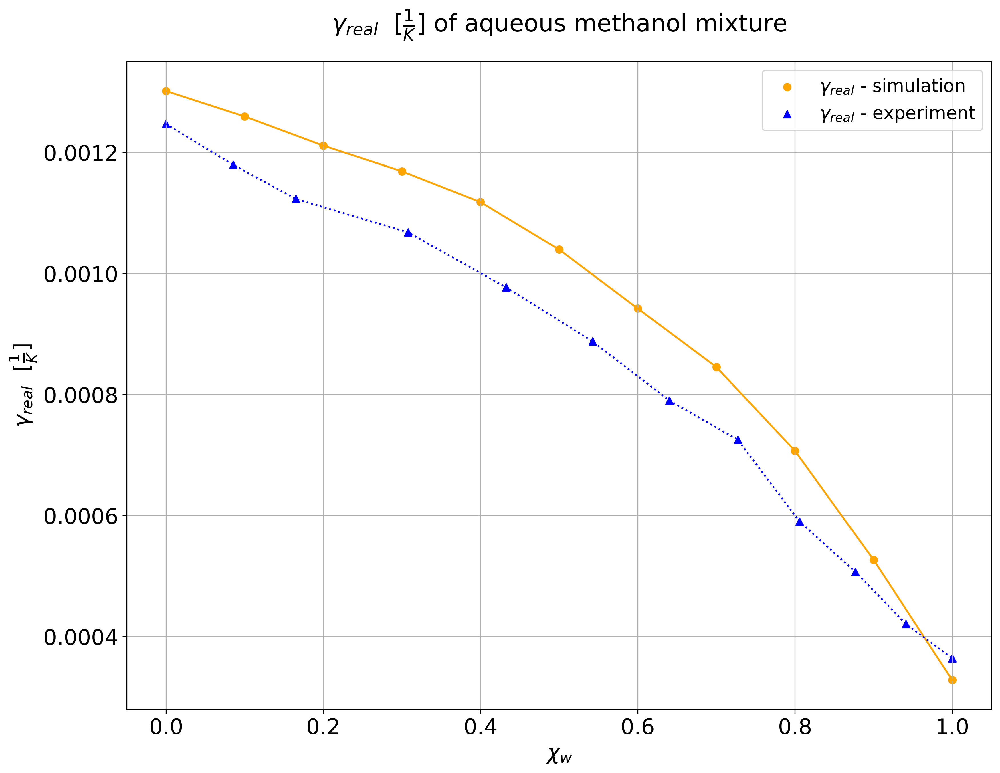

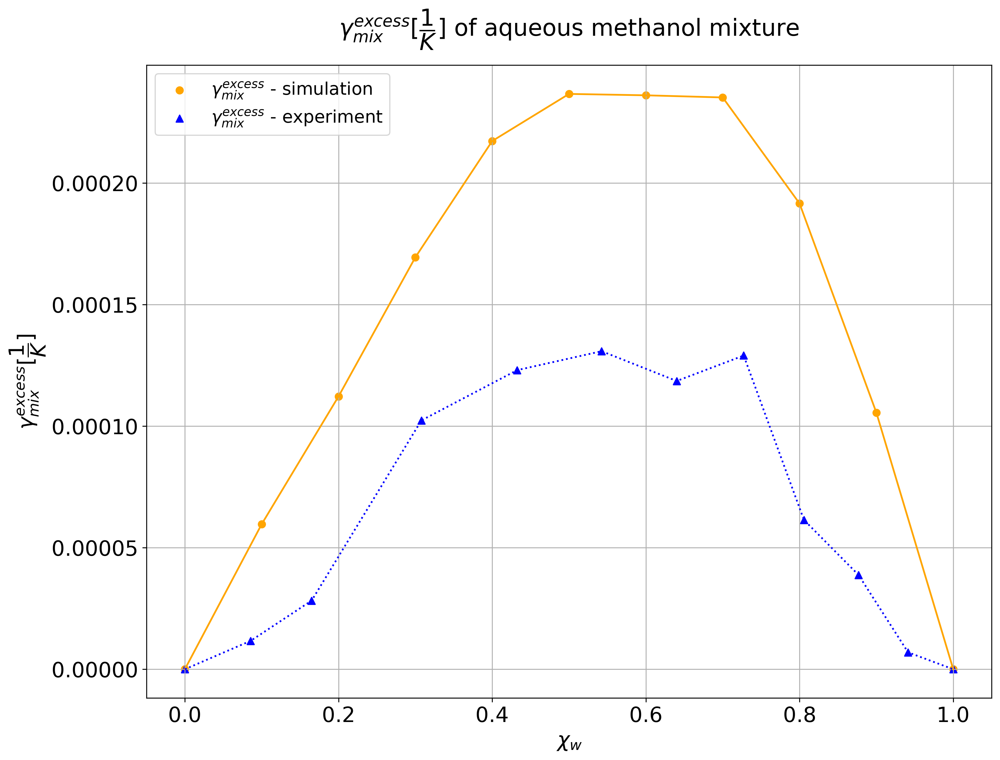

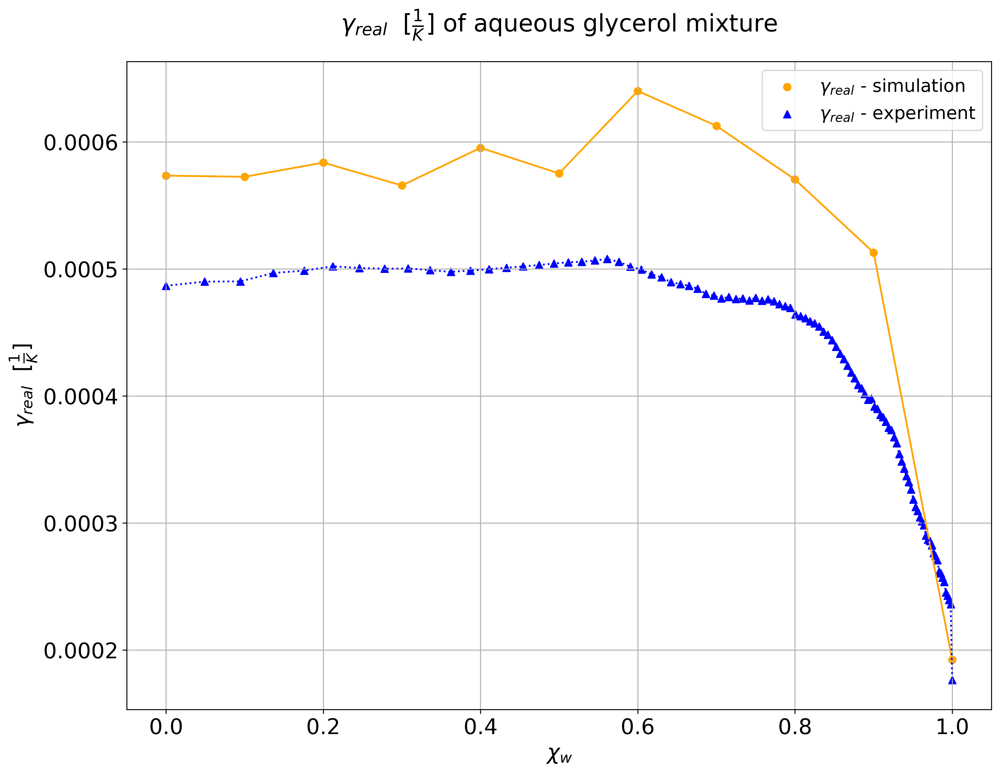

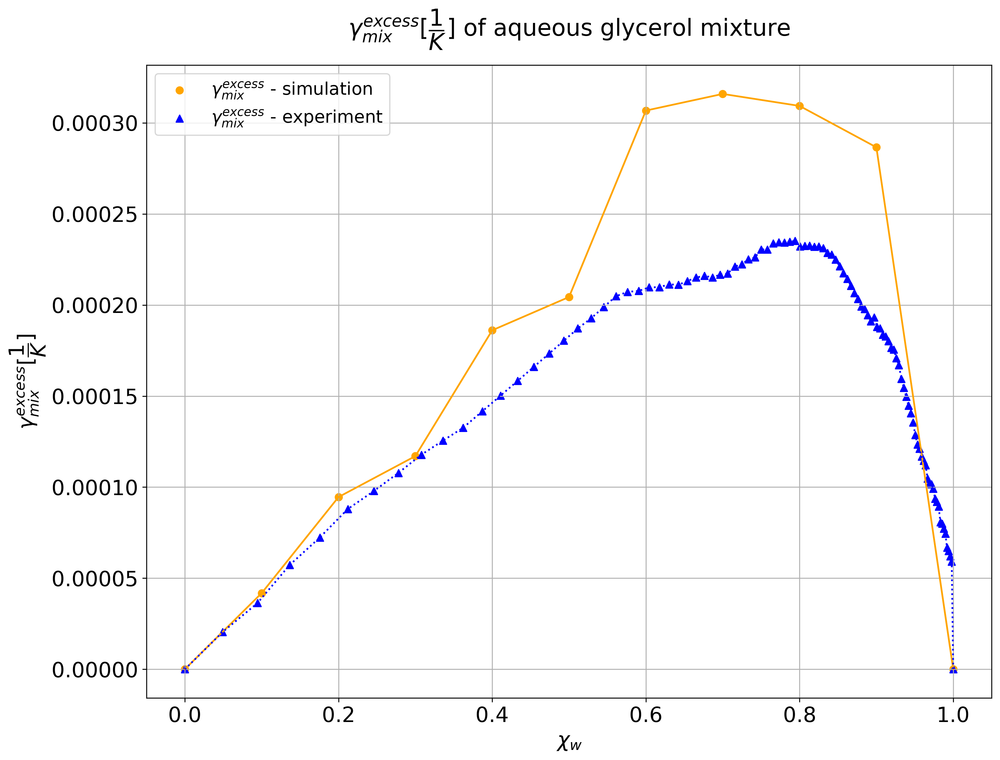

In [6]:
# concat experimental and simulated data
dfs_meth_arr = [dataframe_sim_dens_meth_arr, dataframe_exp_dens_meth_arr]
dfs_glyc_arr = [dataframe_sim_dens_glyc_arr, dataframe_exp_dens_glyc_arr]

# Methanol
vis.plotDataFrame(dfs=dfs_meth_arr, xAx = "Mfcw", yAx = "gammareal", compound="methanol")
vis.plotDataFrame(dfs=dfs_meth_arr, xAx = "Mfcw", yAx = "gammaexcess", compound="methanol")

# Glycerol
vis.plotDataFrame(dfs=dfs_glyc_arr, xAx = "Mfcw", yAx = "gammareal", compound="glycerol")
vis.plotDataFrame(dfs=dfs_glyc_arr, xAx = "Mfcw", yAx = "gammaexcess", compound="glycerol")

The regression itself can also be visualized with it's own plot functionality

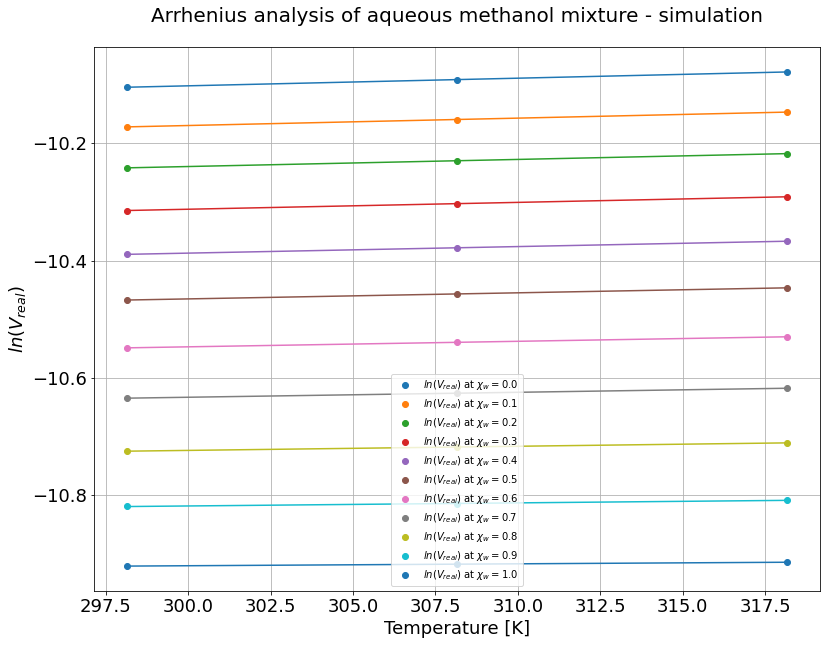

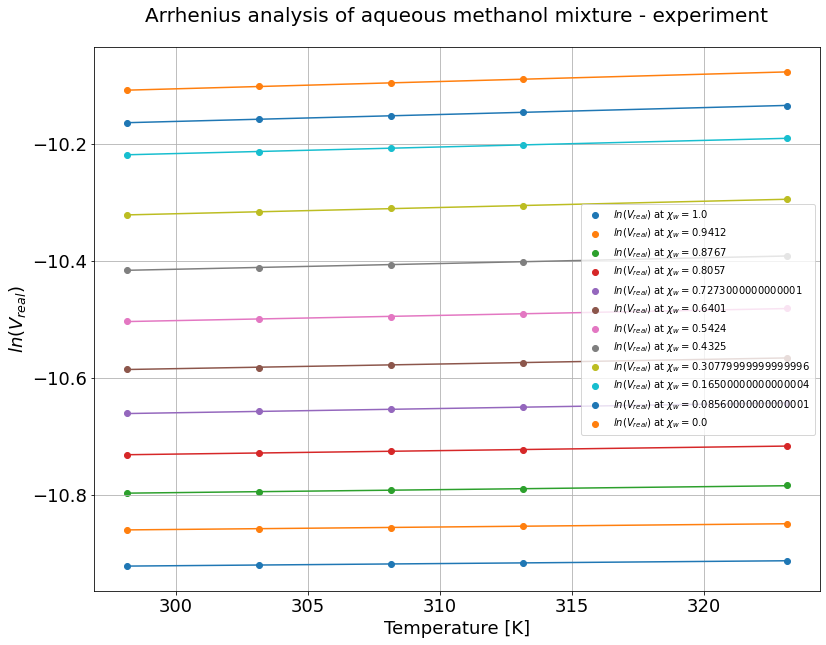

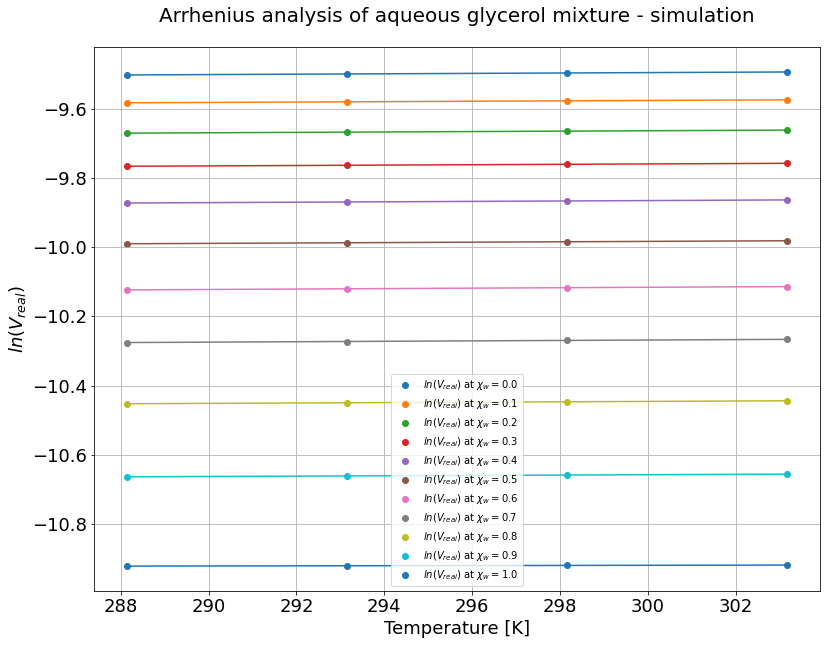

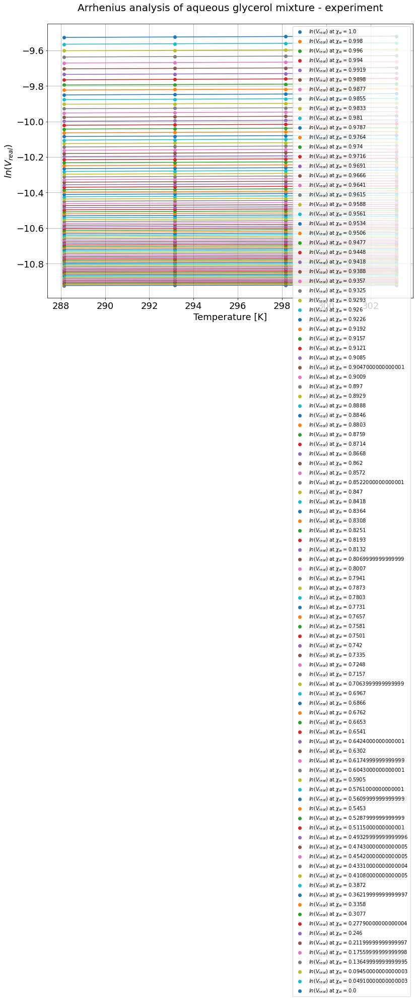

In [ ]:
# Methanol
vis.plotArrheniusDens(df=dataframe_sim_dens_meth_molVol, df_arrhenius=dataframe_sim_dens_meth_arr, compound="methanol")
vis.plotArrheniusDens(df=dataframe_exp_dens_meth_molVol, df_arrhenius=dataframe_exp_dens_meth_arr, compound="methanol")

# Glycerol
vis.plotArrheniusDens(df=dataframe_sim_dens_glyc_molVol, df_arrhenius=dataframe_sim_dens_glyc_arr, compound="glycerol")
vis.plotArrheniusDens(df=dataframe_exp_dens_glyc_molVol, df_arrhenius=dataframe_exp_dens_glyc_arr, compound="glycerol")

## 2.2 Analysis of self-diffusion coefficients
### 2.2.1 Visualization of self-diffusion coefficients
As also done in section 2.1.1 we load the thermoML files of our datasets containing information about self-diffusion coefficient and viscosity and receive the object layer representation.

In [7]:
from pythermo.thermoml.tools import ThermoMLReader

reader = ThermoMLReader(folder_thermoML_files="thermoml_files/")

# Methanol
dataset_sim_transp_meth = reader.readFromThermoMLFile(filename="sim_transp_meth.xml")
dataset_exp_sdiff_meth = reader.readFromThermoMLFile(filename="exp_sdiff_meth.xml")

# Glycerol
dataset_sim_transp_glyc = reader.readFromThermoMLFile(filename="sim_transp_glyc.xml")
dataset_exp_sdiff_glyc = reader.readFromThermoMLFile(filename="exp_sdiff_glyc.xml")

In order to analyze the large datasets, we convert our DataReport objects into a pandas dataframe.

In [8]:
from pythermo_workflow.analysis import Analysis

analysis = Analysis()

# Methanol
dataframe_sim_transp_meth = analysis.createDataFrame(dataReport=dataset_sim_transp_meth)
dataframe_exp_sdiff_meth = analysis.createDataFrame(dataReport=dataset_exp_sdiff_meth)

# Glycerol
dataframe_sim_transp_glyc = analysis.createDataFrame(dataReport=dataset_sim_transp_glyc)
dataframe_exp_sdiff_glyc = analysis.createDataFrame(dataReport=dataset_exp_sdiff_glyc)

print(dataframe_sim_transp_meth)

         Sdiffcw     p1_uncert       Sdiffcc     p2_uncert  Temperature  Mfcw  \
0            NaN           NaN  2.387459e-09  2.173362e-11       298.15   0.0   
1   1.669298e-09  2.976471e-11  2.016055e-09  1.802031e-11       298.15   0.1   
2   1.495106e-09  2.277839e-11  1.752893e-09  1.714938e-11       298.15   0.2   
3   1.374599e-09  1.830027e-11  1.563854e-09  1.767610e-11       298.15   0.3   
4   1.311994e-09  1.725006e-11  1.425156e-09  1.603635e-11       298.15   0.4   
5   1.241861e-09  1.666295e-11  1.302550e-09  1.793975e-11       298.15   0.5   
6   1.228733e-09  1.332460e-11  1.222795e-09  1.496789e-11       298.15   0.6   
7   1.275563e-09  1.807158e-11  1.195277e-09  1.851917e-11       298.15   0.7   
8   1.425507e-09  1.809426e-11  1.248701e-09  2.209176e-11       298.15   0.8   
9   1.634093e-09  2.016273e-11  1.333364e-09  2.514608e-11       298.15   0.9   
10  2.182127e-09  2.753616e-11           NaN           NaN       298.15   1.0   
11           NaN           N

To visualize the self-diffusion coeffecients we can again call the same method as for density derived quantities.

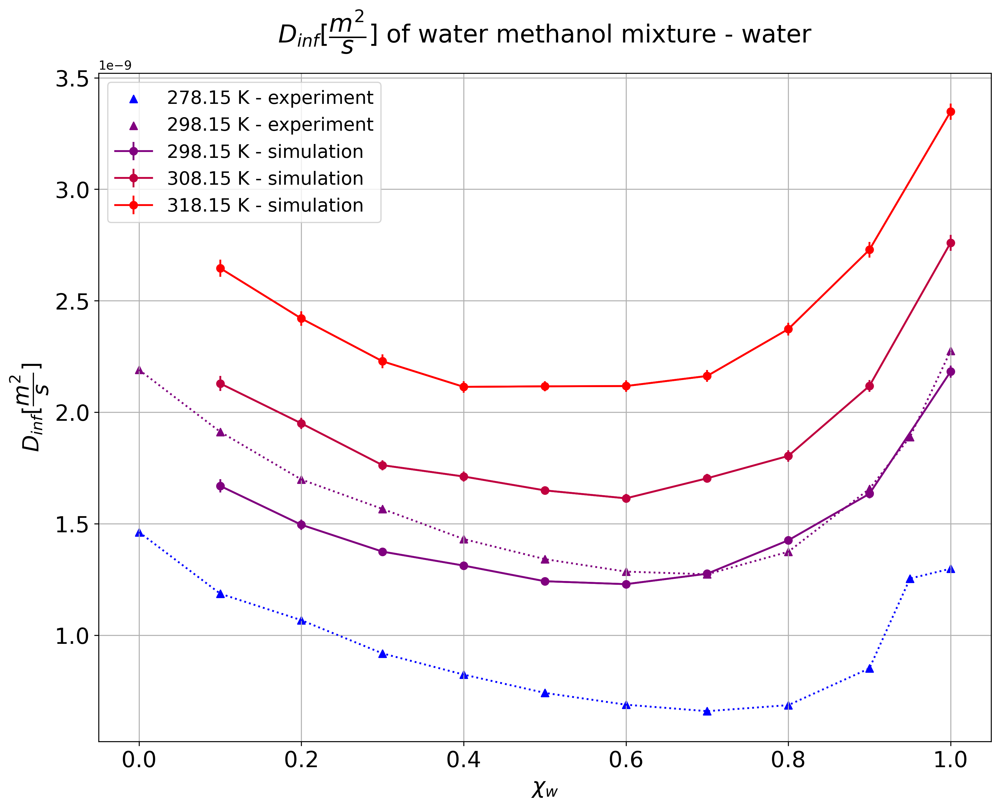

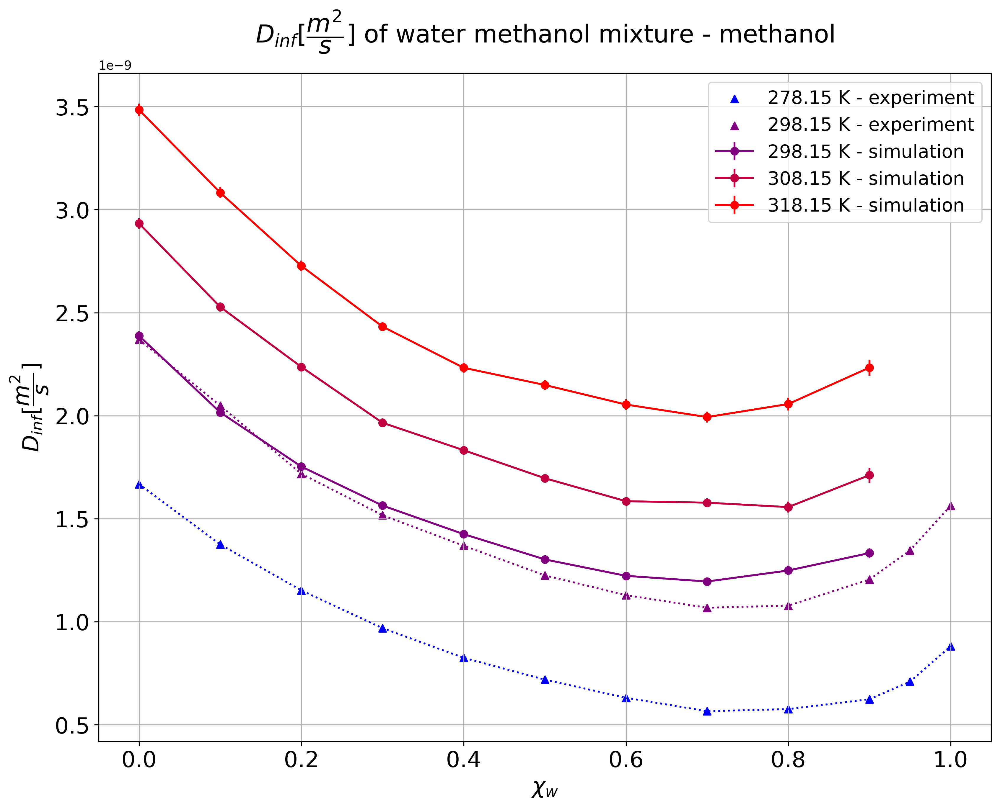

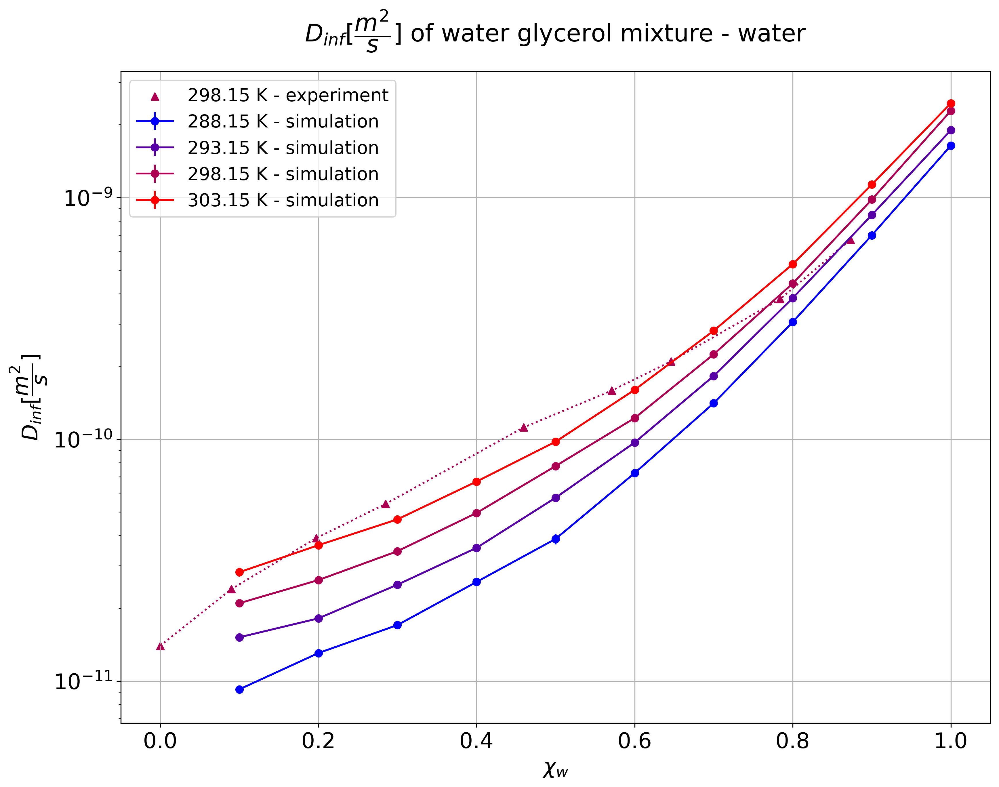

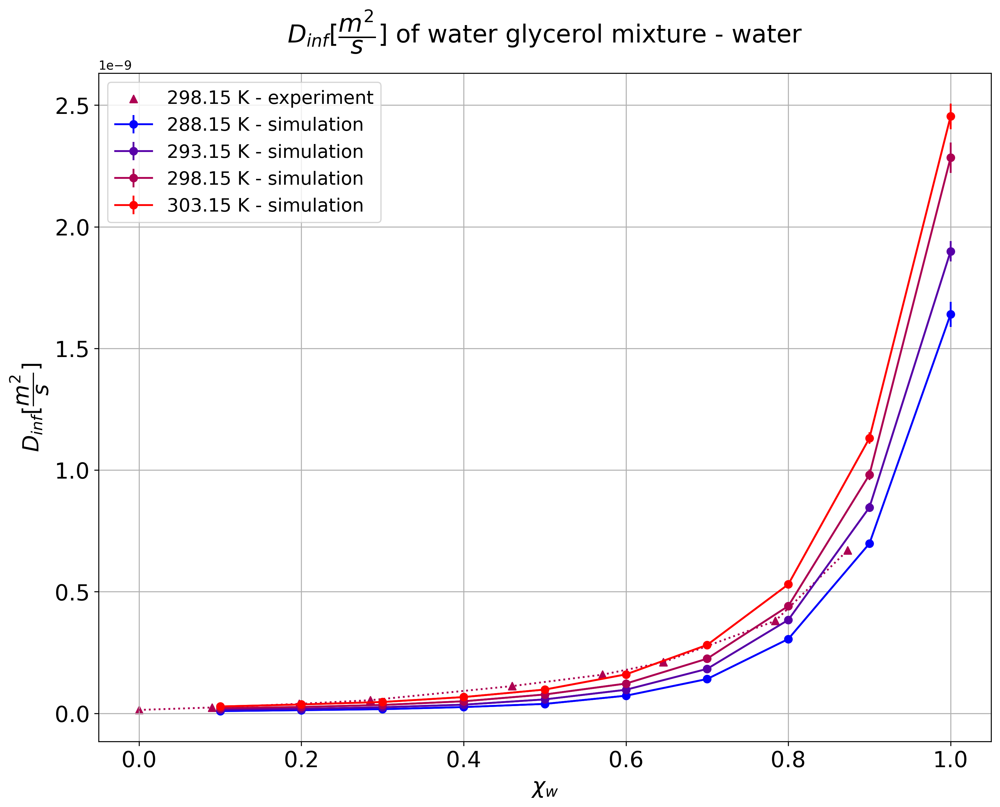

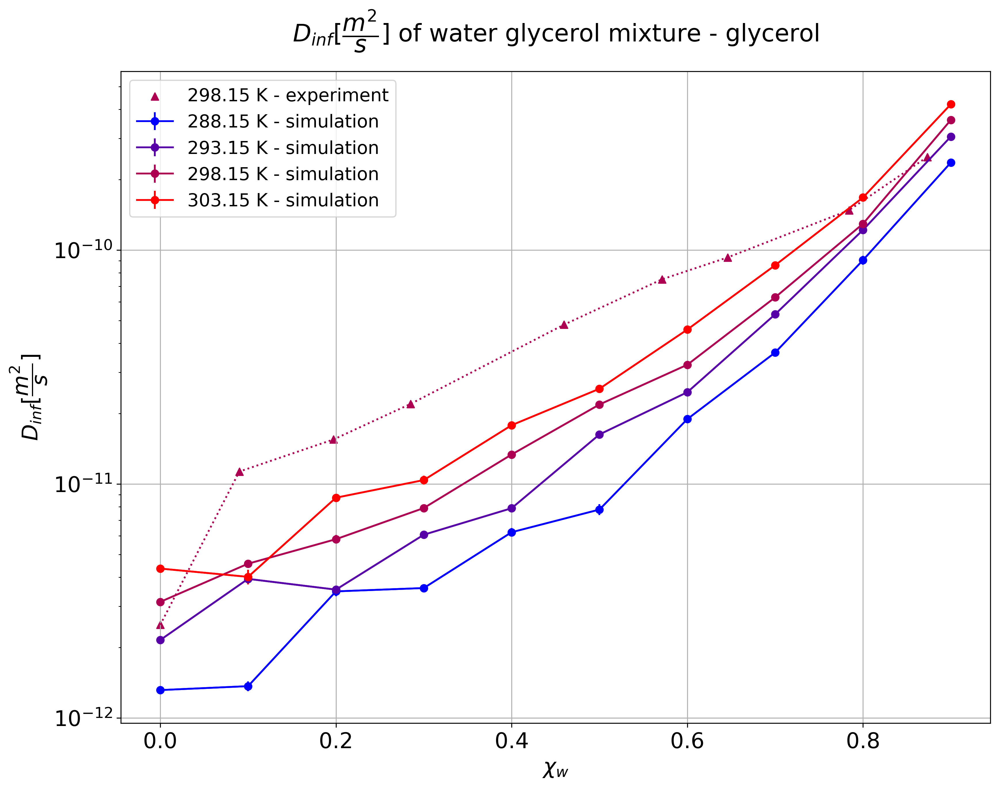

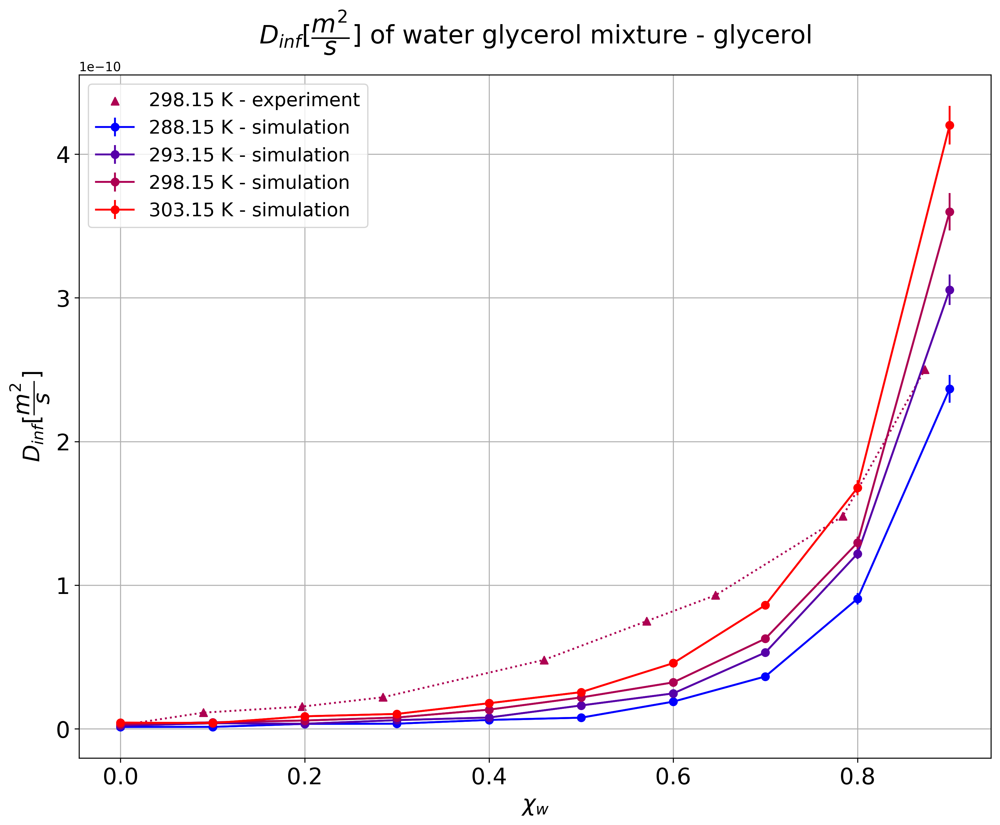

In [9]:
from pythermo_workflow.visualize import Visualize

vis = Visualize(folder_images="plots/")

# concat experimental and simulated data
dfs_meth = [dataframe_sim_transp_meth, dataframe_exp_sdiff_meth]
dfs_glyc = [dataframe_sim_transp_glyc, dataframe_exp_sdiff_glyc]

# aqueous methanol mixture: self-diffusion coefficient of water
vis.plotDataFrame(dfs=dfs_meth, xAx="Mfcw", yAx="Sdiffcw", compound="methanol", errorbar="p1_uncert")

# aqoueous methanol mixture: self-diffusion coefficient of methanol
vis.plotDataFrame(dfs=dfs_meth, xAx="Mfcw", yAx="Sdiffcc", compound="methanol", errorbar="p2_uncert")

# aqoueous glyerol mixture: self-diffusion coefficient of water
vis.plotDataFrame(dfs=dfs_glyc, xAx="Mfcw", yAx="Sdiffcw", compound="glycerol", log=True, errorbar="p1_uncert")
vis.plotDataFrame(dfs=dfs_glyc, xAx="Mfcw", yAx="Sdiffcw", compound="glycerol", errorbar="p1_uncert")

# aqoueous glycerol mixture: self-diffusion coefficient of glycerol
vis.plotDataFrame(dfs=dfs_glyc, xAx="Mfcw", yAx="Sdiffcc", compound="glycerol", log=True, errorbar="p2_uncert")
vis.plotDataFrame(dfs=dfs_glyc, xAx="Mfcw", yAx="Sdiffcc", compound="glycerol", errorbar="p2_uncert")

### 2.2.2 Viscosities
We integrated experimental viscosity data of aqueoues glycerol and methanol mixtures too.
The viscosity of aqueous glycerol was integrated as described for the other quantities, based on .txt files.

In [12]:
from pythermo_workflow.experimental_thermoml import ExperimentThermoML
from pythermo.thermoml.tools.writeTools import ThermoMLWriter

writer = ThermoMLWriter(folder_thermoML_files="thermoml_files/")
converter_exp = ExperimentThermoML(folder_txt_files="txt_files/", folder_thermoML_files="thermoML_files/")

dataset_exp_visc_glyc = converter_exp.readViscGlyc(txt_file="visc_glyc.txt")
writer.writeThermo(dataReport=dataset_exp_visc_glyc, filename="exp_visc_glyc.xml")

The viscosity of aqueous methanol was converted by a seperated script from chemical markup language (cml) to ThermoML, based on work of Gudrun Gygli et al.

We can upload our generated ThermoML files to DaRUS

In [13]:
from pythermo.thermoml.tools.readTools import ThermoMLReader
from pythermo.thermoml.tools.uploadTools import ThermoMLDaRUSHandler
from pyDaRUS.metadatablocks.citation import SubjectEnum
import os

handler = ThermoMLDaRUSHandler(folder_thermoML_files="thermoml_files/")
reader = ThermoMLReader(folder_thermoML_files="thermoml_files/")

authors = ["Matthias Gueltig, Jan Range, Benjamin Schmitz, Juergen Pleiss"]
contact_name = "Matthias Gueltig"
contact_mail = "matthias.gueltig@ibtb.uni-stuttgart.de"
subject = [SubjectEnum.chemistry, SubjectEnum.mathematical__sciences, SubjectEnum.physics, SubjectEnum.engineering]
dv_name = "ibtb_thermoml"

file_dict = {
    "exp_visc_meth.xml": {
        "title": "Viscosities of experimental aqueous methanol mixtures",
        "descr": "Viscosities of experimental aqueous methanol mixtures integrated into ThermoML."
    },
    "exp_visc_glyc.xml": {
        "title": "Viscosities of experimental aqueous glycerol mixtures",
        "descr": "Viscosities of experimental aqueous glycerol mixtures integrated into ThermoML."
    }

}

p_ids = list()

for filename, value in file_dict.items():
    p_ids.append(handler.uploadToDaRUS(thermoML_filename=filename, dv_path=filename, dv_name=dv_name, title = value["title"], subject = subject, description = value["descr"], authors=authors, contact_name=contact_name, contact_mail = contact_mail))

Dataset with pid 'doi:10.18419/darus-3120' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3120
Dataset with pid 'doi:10.18419/darus-3121' created.
https://darus.uni-stuttgart.de//dataset.xhtml?persistentId=doi:10.18419/darus-3121


Again we can read the thermoML files and transform them into a pandas dataframe.

In [14]:
# Methanol
dataset_exp_visc_meth = reader.readFromThermoMLFile(filename="exp_visc_meth.xml")
dataframe_exp_visc_meth = analysis.createDataFrame(dataReport=dataset_exp_visc_meth)

# Glycerol
dataset_exp_visc_glyc = reader.readFromThermoMLFile(filename="exp_visc_glyc.xml")
dataframe_exp_visc_glyc = analysis.createDataFrame(dataReport=dataset_exp_visc_glyc)

And visualize the viscosities:

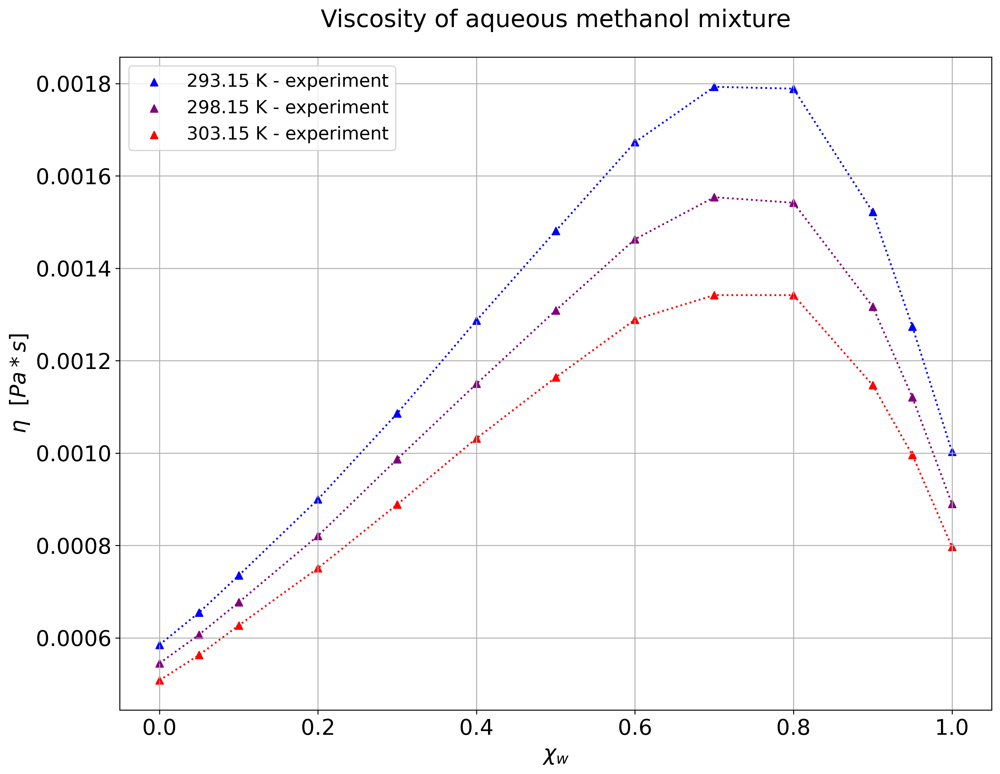

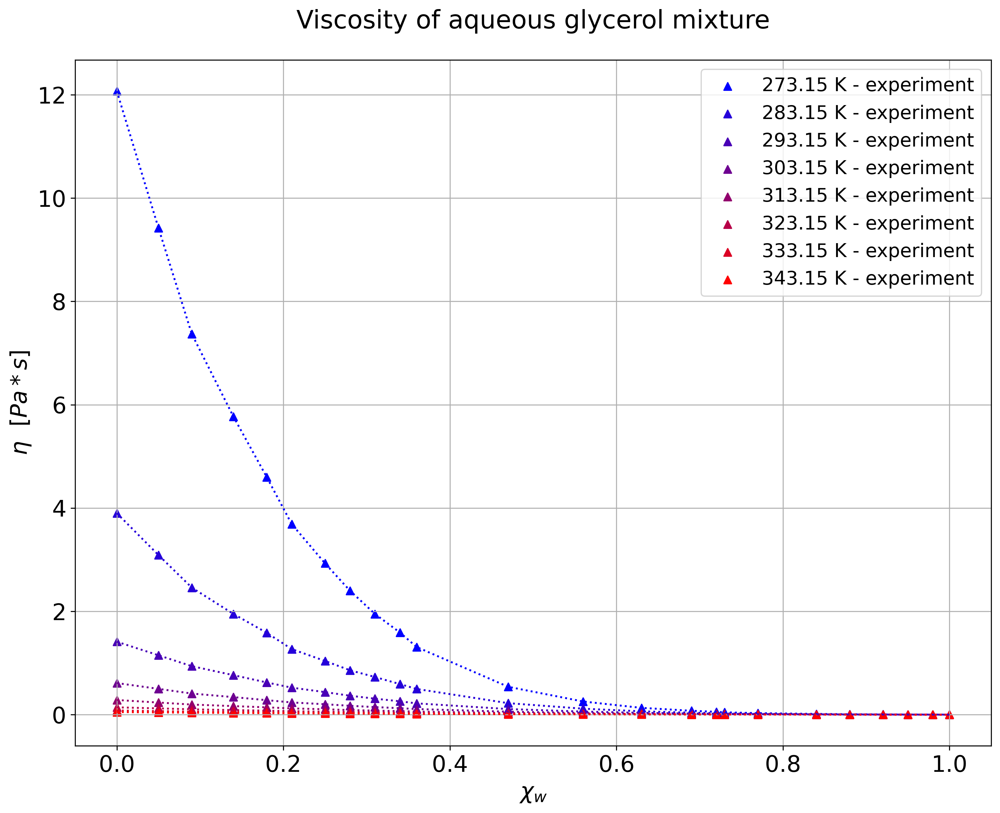

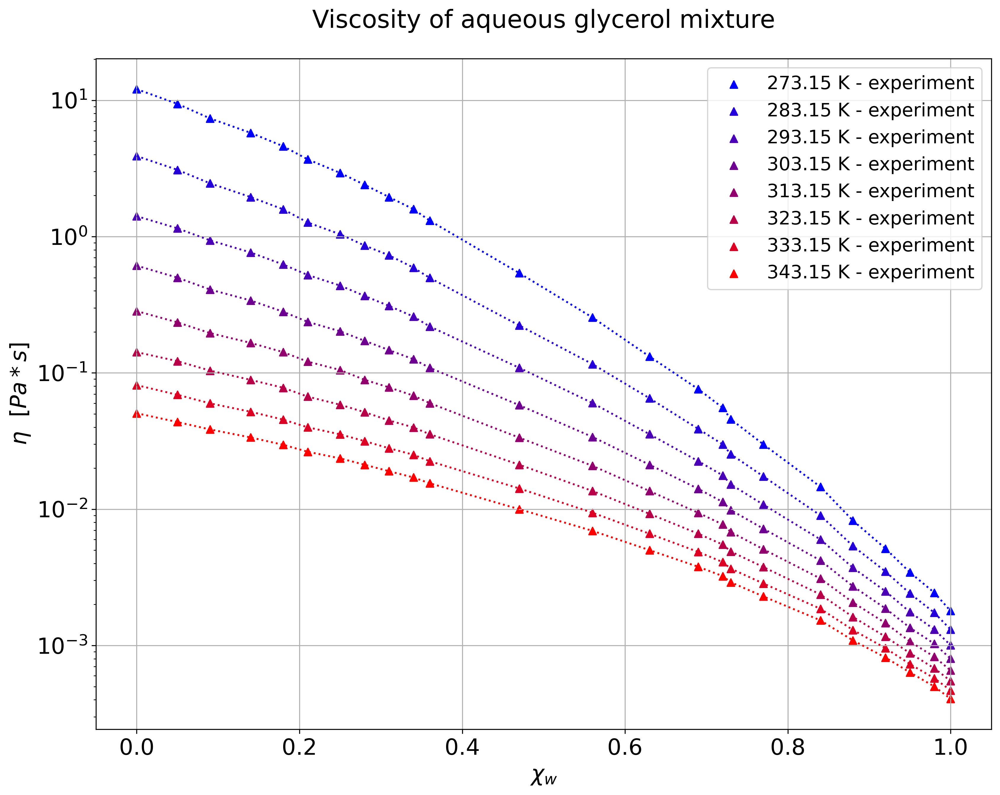

In [15]:
# Methanol
vis.plotDataFrame(dfs=[dataframe_exp_visc_meth], xAx = "Mfcw", yAx = "Viscosity", compound="methanol")

# Glycerol
vis.plotDataFrame(dfs=[dataframe_exp_visc_glyc], xAx = "Mfcw", yAx = "Viscosity", compound="glycerol")
vis.plotDataFrame(dfs=[dataframe_exp_visc_glyc], xAx = "Mfcw", yAx = "Viscosity", compound="glycerol", log=True)

We performed an arrhenius analysis like Gygli et al.

In [16]:
dataframe_exp_visc_meth_arr = analysis.arrheniusVisc(df=dataframe_exp_visc_meth)
dataframe_exp_visc_glyc_arr = analysis.arrheniusVisc(df=dataframe_exp_visc_glyc)

We can again visualize our results:

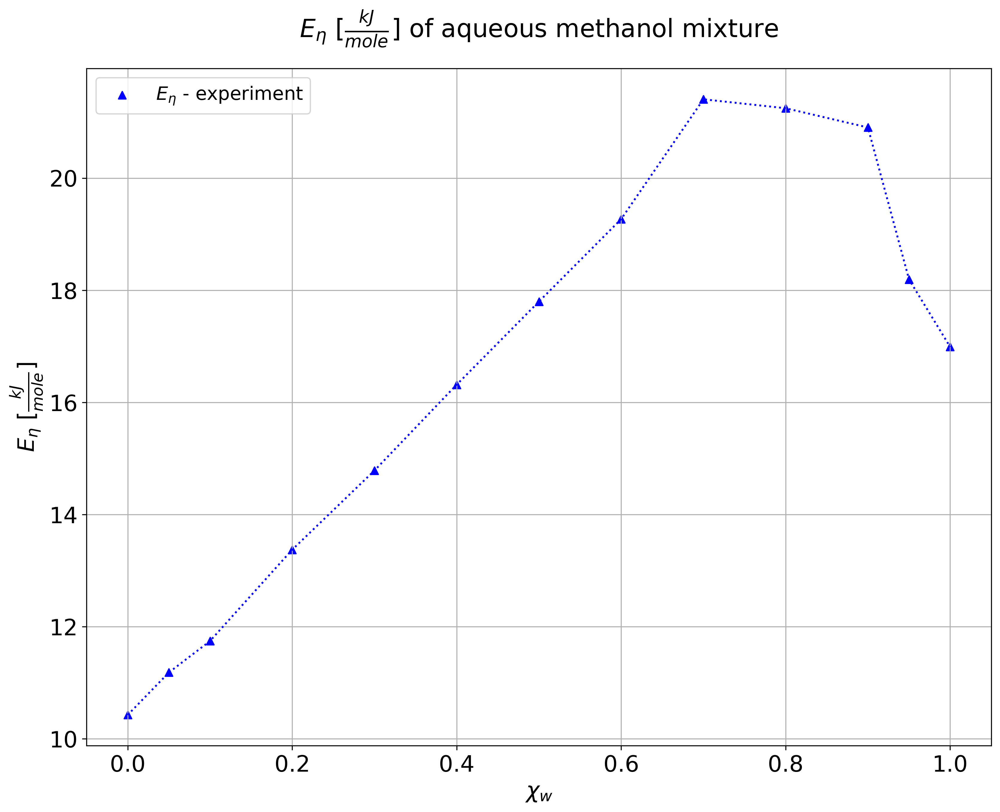

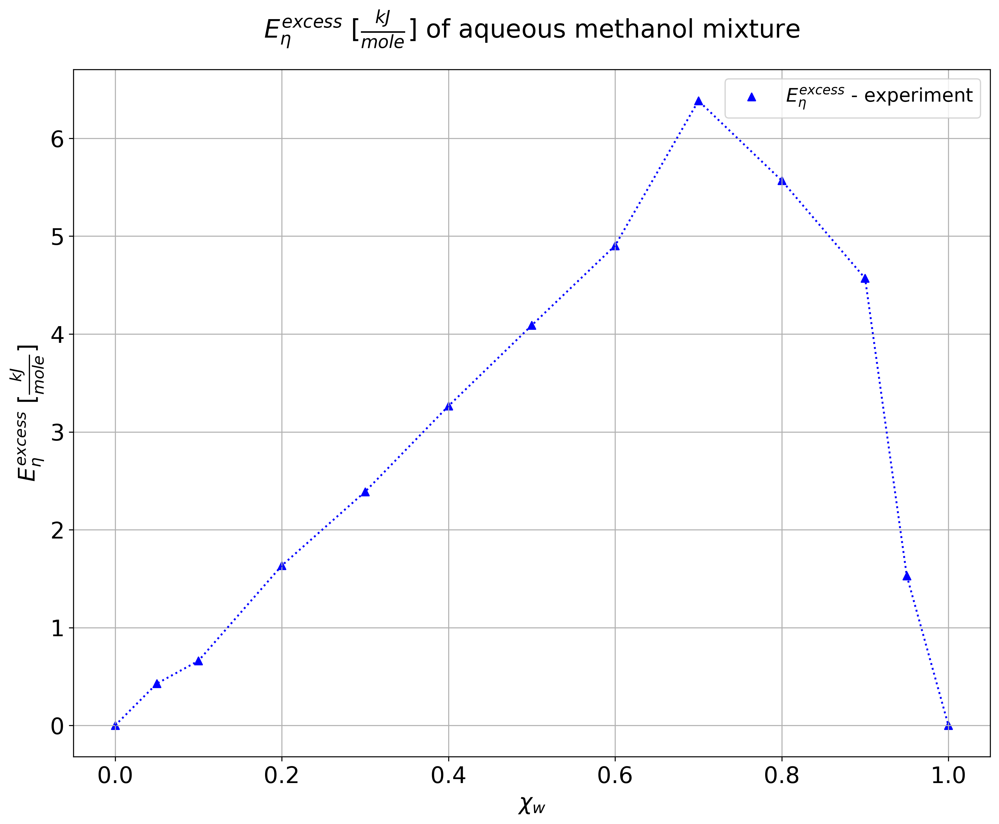

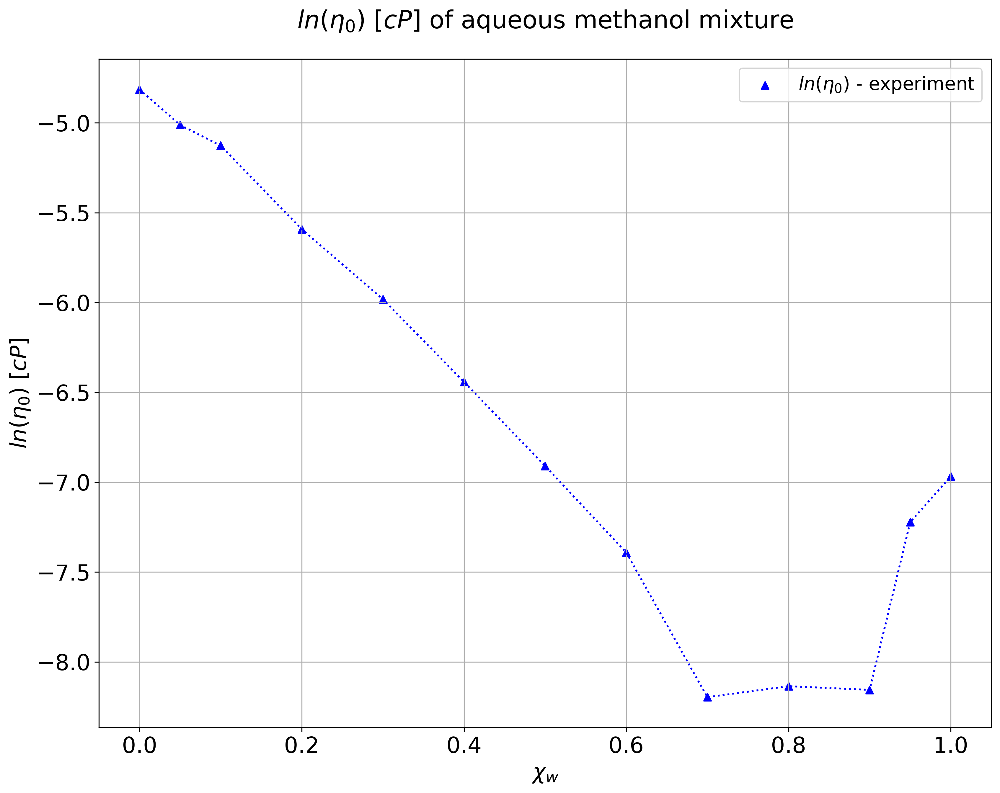

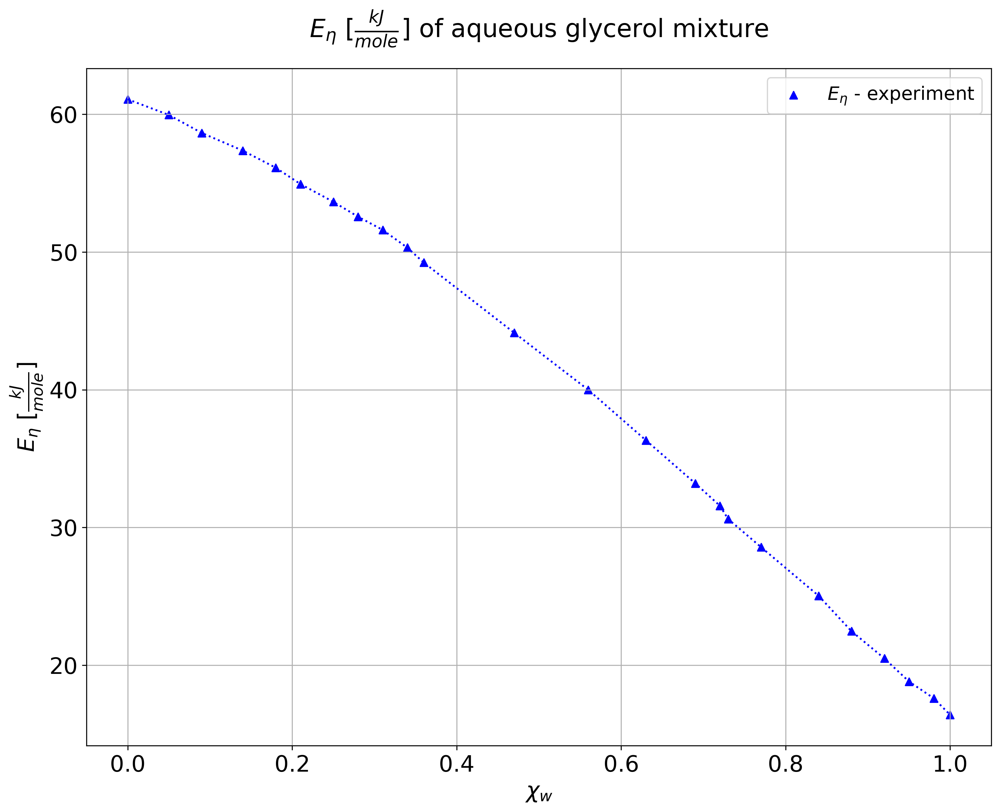

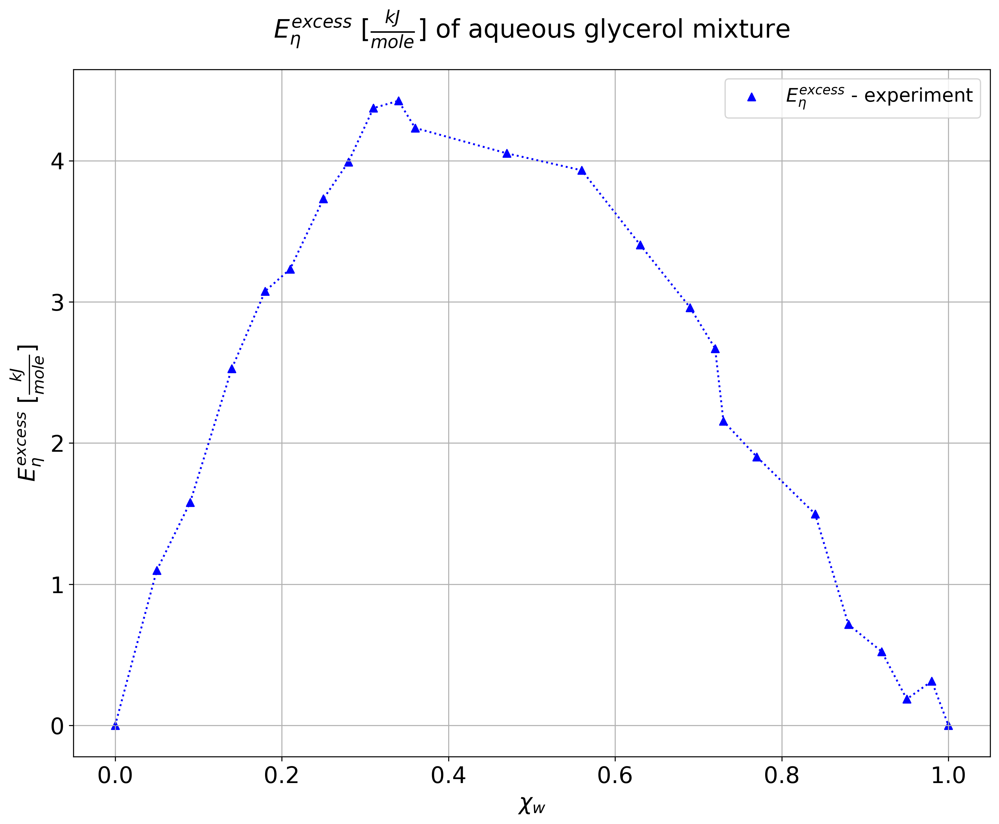

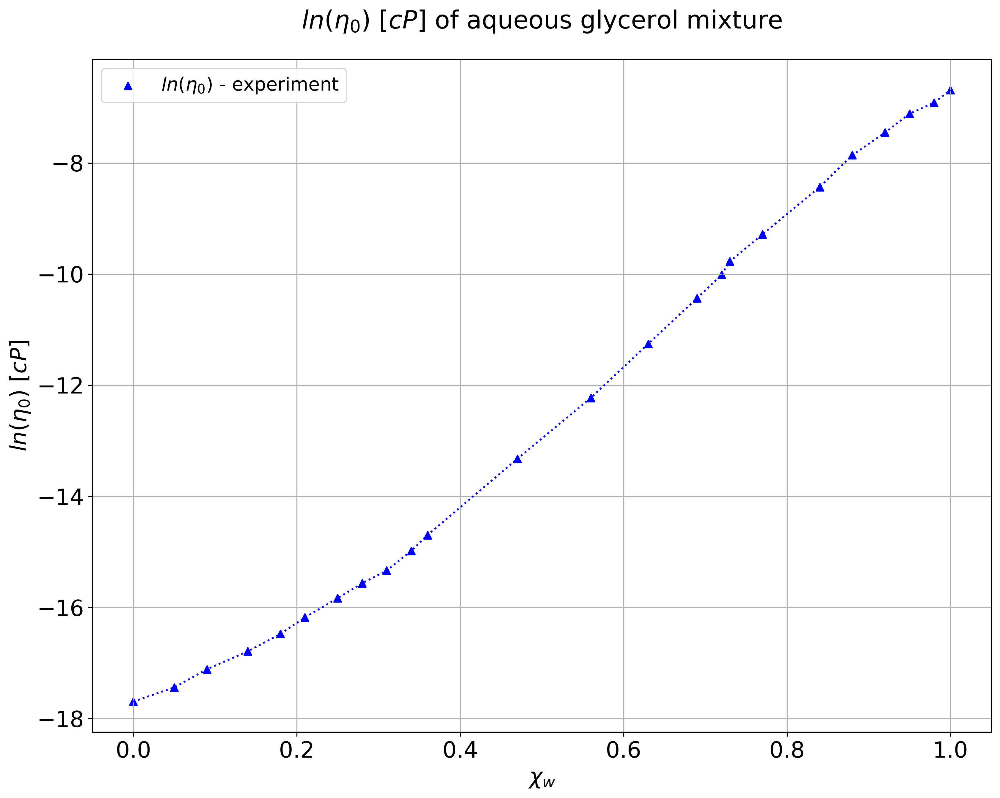

In [17]:
# Methanol
vis.plotDataFrame(dfs=[dataframe_exp_visc_meth_arr], xAx = "Mfcw", yAx = "Eetareal", compound="methanol")
vis.plotDataFrame(dfs=[dataframe_exp_visc_meth_arr], xAx = "Mfcw", yAx = "Eetaexcess", compound="methanol")
vis.plotDataFrame(dfs=[dataframe_exp_visc_meth_arr], xAx = "Mfcw", yAx = "ln(eta0)", compound="methanol")

# Glycerol
vis.plotDataFrame(dfs=[dataframe_exp_visc_glyc_arr], xAx = "Mfcw", yAx = "Eetareal", compound="glycerol")
vis.plotDataFrame(dfs=[dataframe_exp_visc_glyc_arr], xAx = "Mfcw", yAx = "Eetaexcess", compound="glycerol")
vis.plotDataFrame(dfs=[dataframe_exp_visc_glyc_arr], xAx = "Mfcw", yAx = "ln(eta0)", compound="glycerol")

And the Arrhenius plots itself too. 

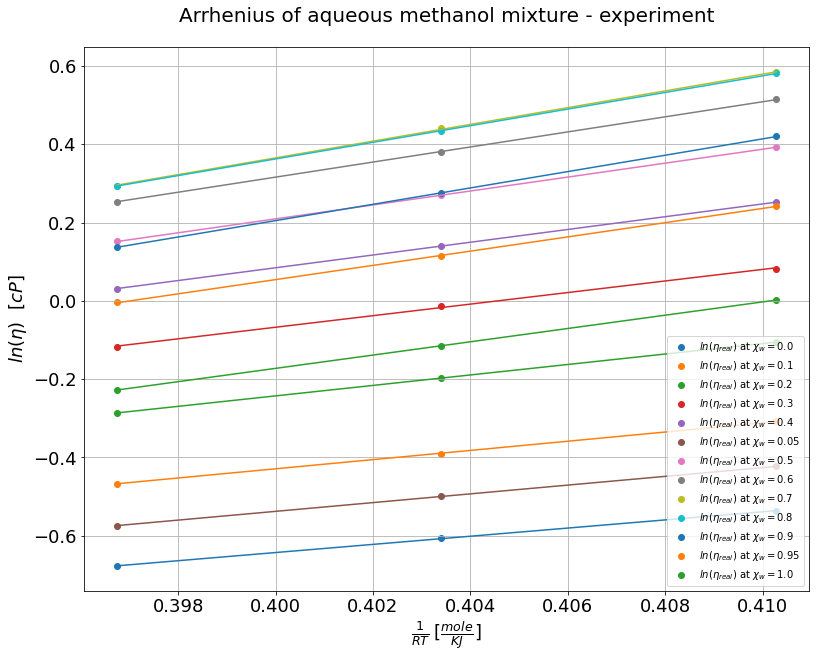

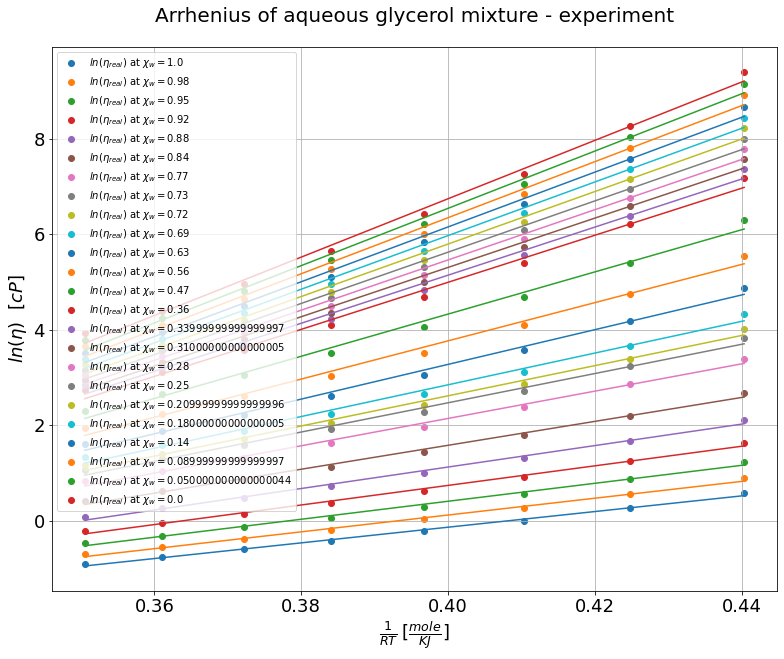

In [18]:
vis.plotArrheniuslnetaRT(df=dataframe_exp_visc_meth, df_arrhenius=dataframe_exp_visc_meth_arr, compound="methanol")
vis.plotArrheniuslnetaRT(df=dataframe_exp_visc_glyc, df_arrhenius=dataframe_exp_visc_glyc_arr, compound="glycerol")